Epoch 0: Cost = 0.2302609996259552
Epoch 100: Cost = 0.09248220400008411
Epoch 200: Cost = 0.07349009963339699
Epoch 300: Cost = 0.06376189356279756
Epoch 400: Cost = 0.057792726553873665
Epoch 500: Cost = 0.053796136591413385
Epoch 600: Cost = 0.0518506020816246
Epoch 700: Cost = 0.049513207800565805
Epoch 800: Cost = 0.047975918071218177
Epoch 900: Cost = 0.046522312764196334
Accuracy: 82.48%


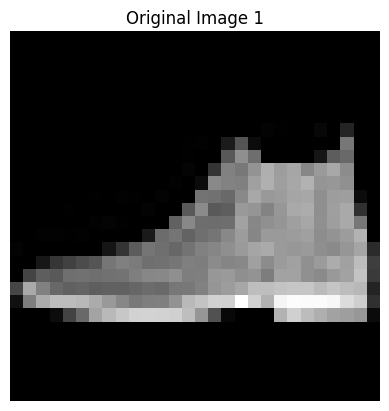

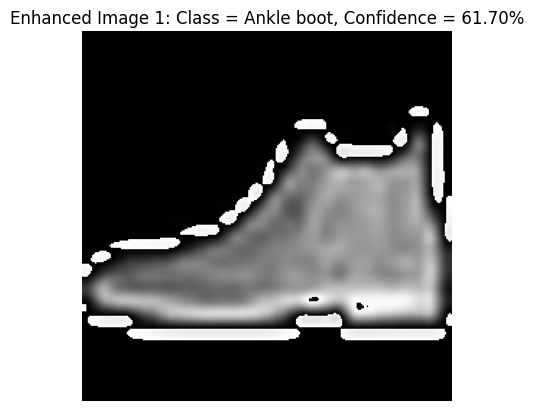

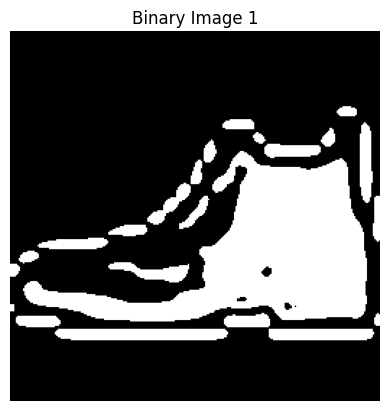

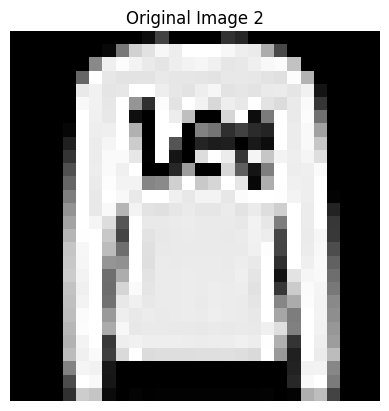

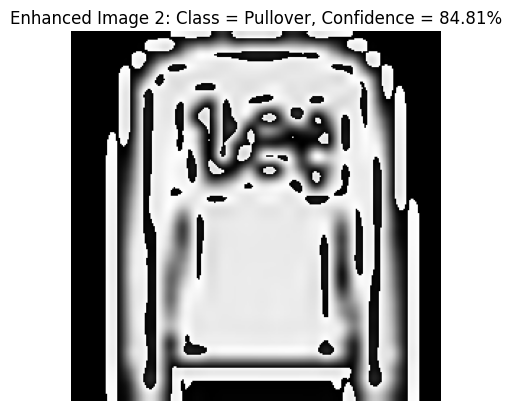

...

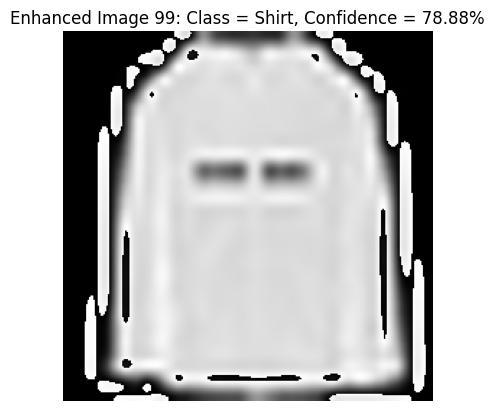

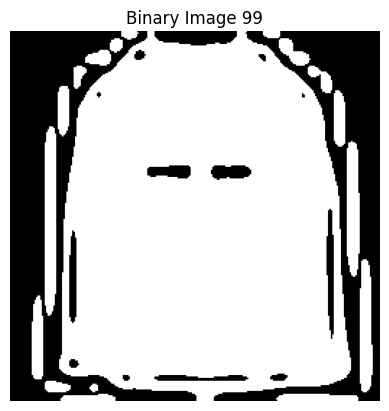

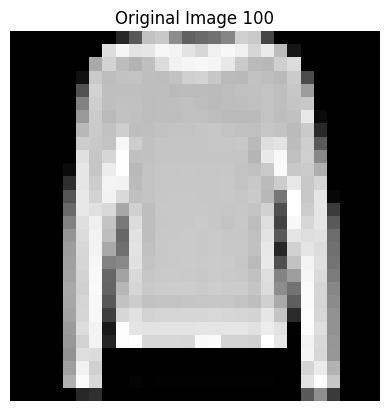

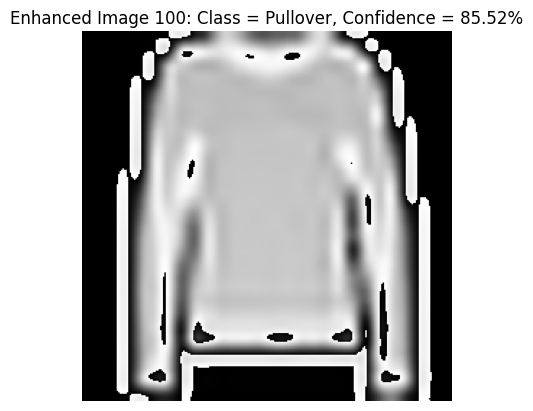

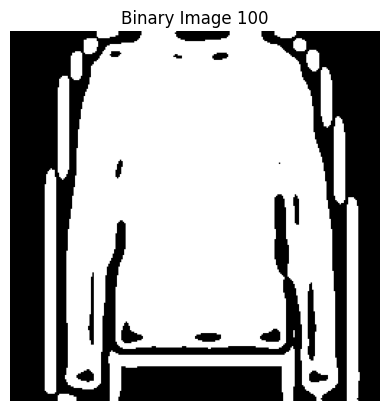

In [25]:
import numpy as np
import matplotlib.pyplot as plt
import struct
import time
import cv2


# Función de activación ReLU
def relu(x):
    return np.maximum(0, x)

# Función de activación Softmax
def softmax(x):
    e_x = np.exp(x - np.max(x))
    return e_x / np.sum(e_x, axis=0)

# Clase de la red neuronal
class NeuralNetwork:
    def __init__(self, input_size, hidden_size, output_size):
        self.W1 = np.random.randn(hidden_size, input_size) * 0.01
        self.b1 = np.zeros((hidden_size, 1))
        self.W2 = np.random.randn(output_size, hidden_size) * 0.01
        self.b2 = np.zeros((output_size, 1))

    def forward(self, X):
        self.Z1 = np.dot(self.W1, X) + self.b1
        self.A1 = relu(self.Z1)
        self.Z2 = np.dot(self.W2, self.A1) + self.b2
        self.A2 = softmax(self.Z2)
        return self.A2

    def backward(self, X, y, learning_rate):
        m = X.shape[1]

        dZ2 = self.A2 - y
        W2_T = self.W2.T  # Compute once and use twice
        dW2 = (1 / m) * np.dot(dZ2, self.A1.T)
        db2 = (1 / m) * np.sum(dZ2, axis=1, keepdims=True)

        dA1 = np.dot(W2_T, dZ2)
        dZ1 = dA1 * (self.Z1 > 0)
        dW1 = (1 / m) * np.dot(dZ1, X.T)
        db1 = (1 / m) * np.sum(dZ1, axis=1, keepdims=True)

        self.W2 -= learning_rate * dW2
        self.b2 -= learning_rate * db2
        self.W1 -= learning_rate * dW1
        self.b1 -= learning_rate * db1

# Función para leer los archivos IDX
def read_idx(filename):
    with open(filename, 'rb') as f:
        zero, data_type, dims = struct.unpack('>HBB', f.read(4))
        shape = tuple(struct.unpack('>I', f.read(4))[0] for d in range(dims))
        return np.frombuffer(f.read(), dtype=np.uint8).reshape(shape)

# Función para cargar y preprocesar los datos de Fashion MNIST
def load_data():
    # Cargar los archivos
    x_train = read_idx('train-images-idx3-ubyte') / 255.0
    y_train = np.eye(10)[read_idx('train-labels-idx1-ubyte')].T
    x_test = read_idx('t10k-images-idx3-ubyte') / 255.0
    y_test = np.eye(10)[read_idx('t10k-labels-idx1-ubyte')].T

    # Aplanar las imágenes
    x_train = x_train.reshape(x_train.shape[0], -1).T
    x_test = x_test.reshape(x_test.shape[0], -1).T

    return x_train, y_train, x_test, y_test

# Función para entrenar la red neuronal
def train_model(x_train, y_train, hidden_size, learning_rate, epochs):
    input_size = x_train.shape[0]
    output_size = y_train.shape[0]
    neural_network = NeuralNetwork(input_size, hidden_size, output_size)

    for epoch in range(epochs):
        # Forward pass
        y_pred = neural_network.forward(x_train)

        # Calcular la función de costo (entropía cruzada)
        cost = -np.mean(y_train * np.log(y_pred + 1e-8))

        # Backward pass
        neural_network.backward(x_train, y_train, learning_rate)

        if epoch % 100 == 0:
            print(f"Epoch {epoch}: Cost = {cost}")

    return neural_network

# Función para evaluar el modelo en el conjunto de prueba
def evaluate_model(neural_network, x_test, y_test):
    y_pred = neural_network.forward(x_test)
    y_pred = np.argmax(y_pred, axis=0)
    y_true = np.argmax(y_test, axis=0)
    accuracy = np.mean(y_pred == y_true) * 100
    print(f"Accuracy: {accuracy}%")

    return y_pred

# Función para obtener la clase correspondiente a un índice
def get_class_name(class_index):
    class_names = [
        "T-shirt/top",
        "Pants",
        "Pullover",
        "Dress",
        "Coat",
        "Sandal",
        "Shirt",
        "Sneaker",
        "Bag",
        "Ankle boot"
    ]
    return class_names[class_index]

# Cargar y preprocesar los datos
x_train, y_train, x_test, y_test = load_data()

# Definir los hiperparámetros
hidden_size = 100
learning_rate = 0.1
epochs = 1000

# Entrenar el modelo
neural_network = train_model(x_train, y_train, hidden_size, learning_rate, epochs)

# Evaluar el modelo
y_pred = evaluate_model(neural_network, x_test, y_test)


# Imprimir resultados para las primeras 100 imágenes de prueba
for i in range(min(100, y_pred.shape[0])):
    class_index = y_pred[i]
    class_name = get_class_name(class_index)
    confidence = neural_network.A2[class_index, i] * 100
    image = x_test[:, i].reshape(28, 28)

    # Mostrar la imagen original y la información
    plt.imshow(image, cmap='gray')
    plt.title(f"Original Image {i+1}")
    plt.axis('off')
    plt.show()

    # Mejorar calidad y añadir color con OpenCV
    image_enhanced = cv2.resize(image, (256, 256), interpolation=cv2.INTER_CUBIC)
    image_enhanced = (image_enhanced * 255).astype(np.uint8)  # Normalizar a rango de 0-255
    image_enhanced = cv2.cvtColor(image_enhanced, cv2.COLOR_GRAY2RGB)

    # Mostrar la imagen mejorada con color
    plt.imshow(image_enhanced)
    plt.title(f"Enhanced Image {i+1}: Class = {class_name}, Confidence = {confidence:.2f}%")
    plt.axis('off')
    plt.show()

    # Algoritmo de umbralización para eliminar falsos positivos y falsos negativos
    gray_image = cv2.cvtColor(image_enhanced, cv2.COLOR_RGB2GRAY)
    _, binary_image = cv2.threshold(gray_image, 127, 255, cv2.THRESH_BINARY)

    # Mostrar la imagen binarizada
    plt.imshow(binary_image, cmap='gray')
    plt.title(f"Binary Image {i+1}")
    plt.axis('off')
    plt.show()

    if i == 99:
        break
